# Pix2Pix Pytorch Implementation

## Imports

In [1]:
import os
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import os
import glob

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms


## Visualizing Samples of Dataset
First, we split the actual images in the directories of this dataset to attain the original and the segmentation mask, and show it down below: 


Number of training images: 2975
Number of validation images: 500


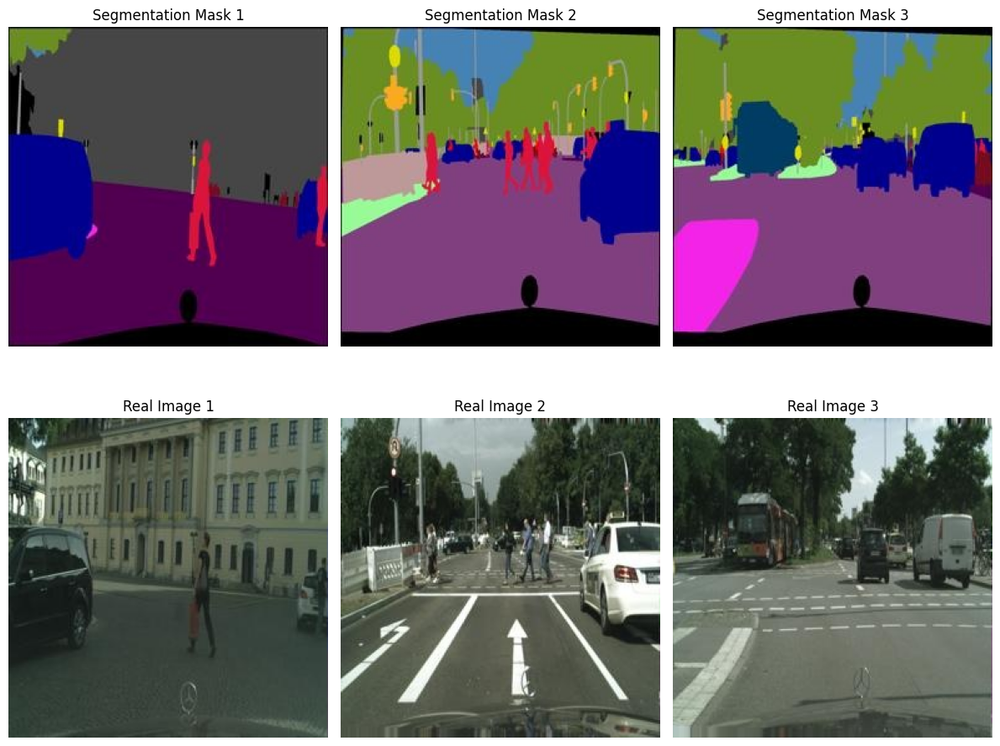

In [2]:
DATASET_PATH = '/kaggle/input/cityscapes-pix2pix-dataset'

def dataset_paths():
    train_dir = os.path.join(DATASET_PATH, 'train')
    val_dir = os.path.join(DATASET_PATH, 'val')
    
    train_images = len(glob.glob(os.path.join(train_dir, '*')))
    val_images = len(glob.glob(os.path.join(val_dir, '*')))
    
    print(f"\nNumber of training images: {train_images}")
    print(f"Number of validation images: {val_images}")
    
    return train_dir, val_dir

def show_dataset_sample(train_dir, num_samples=3):
    image_paths = glob.glob(os.path.join(train_dir, '*'))
    
    sample_paths = np.random.choice(image_paths, num_samples, replace=False)
    
    fig, axes = plt.subplots(2, num_samples, figsize=(4*num_samples, 10))
    
    for idx, path in enumerate(sample_paths):
        img = Image.open(path)
        width = img.size[0]
        height = img.size[1]
        # Split into segmentation mask and real image
        seg_mask = img.crop((width//2, 0, width, img.size[1]))
        real_img = img.crop((0, 0, width//2, img.size[1]))
        
        # Display the pairs
        axes[0, idx].imshow(seg_mask)
        axes[0, idx].set_title(f'Segmentation Mask {idx+1}')
        axes[0, idx].axis('off')
        
        axes[1, idx].imshow(real_img)
        axes[1, idx].set_title(f'Real Image {idx+1}')
        axes[1, idx].axis('off')
    
    plt.tight_layout()
    plt.show()

train_dir, val_dir = dataset_paths()
show_dataset_sample(train_dir)

## Dataset and Dataloader 
Just like how we splitted the images of dataset to pairs of segmentation and actual data, we will also create a dataset which stores paths to images. Then, when the i-th element of the dataset is called, it will separate the source and target images and return them as a pair. 

For each of the train and validation use cases a distinct dataloader is loaded.

For the hyperparameters, a batch size of 32 is used and also 2 worker threads for each dataloader.

In [3]:
class CityscapesDataset(Dataset):
    def __init__(self, root_dir, transform=None, mode='train'):
        self.root_dir = root_dir
        self.transform = transform
        self.mode = mode
        self.image_paths = glob.glob(os.path.join(root_dir, '*'))
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        # Load the combined image
        image = Image.open(img_path)
        w, h = image.size
        
        # Split into segmentation mask and real image
        seg_mask = image.crop((0, 0, w//2, h))
        real_img = image.crop((w//2, 0, w, h))
        
        if self.transform:
            seg_mask = self.transform(seg_mask)
            real_img = self.transform(real_img)
            
        return seg_mask, real_img

def create_dataloaders(train_dir, val_dir, batch_size=1, num_workers=2):
    transform = transforms.Compose([transforms.ToTensor()])
    
    # Create datasets
    train_dataset = CityscapesDataset(
        root_dir=train_dir,
        transform=transform,
        mode='train'
    )
    
    val_dataset = CityscapesDataset(
        root_dir=val_dir,
        transform=transform,
        mode='val'
    )
    
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True
    )
    
    return train_loader, val_loader


train_loader, val_loader = create_dataloaders(
    train_dir=train_dir,
    val_dir=val_dir,
    batch_size=32,  
    num_workers=2   
)

## Data Utils
We consider functions for transforming back the array of numbers as a tensor to image space and also a function to show the results of our model during  the training. It receives a segmentation image, a generated image based on that and the real image which is the ground truth.

In [4]:
def tensor_to_image(tensor):
    image = tensor.cpu().detach().numpy()
    image = (np.transpose(image, (1, 2, 0)) + 1) / 2.0
    return np.clip(image, 0, 1)
        
def show_sample_images(generator, condition_images, real_images, epoch):
    with torch.no_grad():
        fake_images = generator(condition_images)
        
        num_samples = min(3, condition_images.size(0))  # Show up to 3 samples
        fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
        
        for idx in range(num_samples):
            condition = tensor_to_image(condition_images[idx])
            fake = tensor_to_image(fake_images[idx])
            real = tensor_to_image(real_images[idx])
            
            axes[idx, 0].imshow(condition)
            axes[idx, 0].set_title('Input Segmentation')
            axes[idx, 0].axis('off')
            
            axes[idx, 1].imshow(fake)
            axes[idx, 1].set_title('Generated Image')
            axes[idx, 1].axis('off')
            
            axes[idx, 2].imshow(real)
            axes[idx, 2].set_title('Real Image')
            axes[idx, 2].axis('off')
        
        plt.suptitle(f'Epoch {epoch}', fontsize=16)
        plt.tight_layout()
        plt.show()
        plt.close()

## Architecture
We adopt the architecture of the orignial Pix2Pix model. The generator consists of a UNet which has 8 layers for encoding the image and then uses 7 layers to return this rich and informative vector back to the image domain. The use of SkipConnecitonLayer which simply concat a copy of encoder layer outputs to that of the mirror layers in the decoder. 

For the loss functions, we use the typical adversarial loss of GANs, in addition to the pixel-wise loss for the generator. The hyperparameter $\lambda$ for the pixel-wise loss is 100.

In [5]:
class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels, use_bn=True):
        super(DownSample, self).__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        ]
        if use_bn:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2))
        self.down = nn.Sequential(*layers)

    def forward(self, x):
        return self.down(x)

class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels, use_dropout=False):
        super(UpSample, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        if use_dropout:
            layers.append(nn.Dropout(0.5))
        self.up = nn.Sequential(*layers)

    def forward(self, x, skip_input=None):
        if skip_input is not None:
            x = torch.cat([x, skip_input], 1)
        return self.up(x)

class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(Generator, self).__init__()
        
        # Encoder
        self.down1 = DownSample(in_channels, 64, use_bn=False)
        self.down2 = DownSample(64, 128)
        self.down3 = DownSample(128, 256)
        self.down4 = DownSample(256, 512)
        self.down5 = DownSample(512, 512)
        self.down6 = DownSample(512, 512)
        self.down7 = DownSample(512, 512)
        self.down8 = DownSample(512, 512)
        
        # Decoder
        self.up1 = UpSample(512, 512, use_dropout=True)
        self.up2 = UpSample(1024, 512, use_dropout=True)
        self.up3 = UpSample(1024, 512, use_dropout=True)
        self.up4 = UpSample(1024, 512)
        self.up5 = UpSample(1024, 256)
        self.up6 = UpSample(512, 128)
        self.up7 = UpSample(256, 64)
        
        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        
        # Decoder with skip connections
        u1 = self.up1(d8)
        u2 = self.up2(u1, d7)
        u3 = self.up3(u2, d6)
        u4 = self.up4(u3, d5)
        u5 = self.up5(u4, d4)
        u6 = self.up6(u5, d3)
        u7 = self.up7(u6, d2)
        
        return self.final(torch.cat([u7, d1], 1))

class Discriminator(nn.Module):
    def __init__(self, in_channels=6):  # 6 channels (3 for real/fake image + 3 for condition)
        super(Discriminator, self).__init__()

        def discriminator_block(in_channels, out_channels, normalize=True):
            layers = [nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.LeakyReLU(0.2))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, kernel_size=4, padding=1)
        )

    def forward(self, img, condition):
        x = torch.cat([img, condition], 1)
        return self.model(x)

class Pix2PixLoss:
    def __init__(self, lambda_pixel=100):
        self.lambda_pixel = lambda_pixel
        self.gan_loss = nn.BCEWithLogitsLoss()
        self.l1_loss = nn.L1Loss()

    def discriminator_loss(self, real_pred, fake_pred):
        real_target = torch.ones_like(real_pred)
        fake_target = torch.zeros_like(fake_pred)
        real_loss = self.gan_loss(real_pred, real_target)
        fake_loss = self.gan_loss(fake_pred, fake_target)
        return (real_loss + fake_loss) * 0.5

    def generator_loss(self, fake_pred, fake_image, real_image):
        gan_loss = self.gan_loss(fake_pred, torch.ones_like(fake_pred))
        l1_loss = self.l1_loss(fake_image, real_image) * self.lambda_pixel
        return gan_loss + l1_loss, gan_loss, l1_loss


## Train
The only detail that should be highlighted is the fact that the Discriminator (D) is trained for half the steps of odd epochs, and the rest of the steps train the Generator (G). I decided to do it this way due to the faster convergence of D toward its optimal value:
$$D^{*}_G(x) = \frac{p_\text{data}(x)}{p_\text{data}(x) + p_g(x)}$$
Hence, a small training window is given to D, for a more balanced training of weights between the two modules.  

In [6]:
def train_model(generator, discriminator, train_loader, num_epochs=50, train_period=0.5, device='cuda'):
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    
    loss_calc = Pix2PixLoss()
    
    g_losses = []
    d_losses = []
    
    for epoch in range(num_epochs):
        for i, (real_images, condition_images) in enumerate(train_loader):
            real_images = real_images.to(device)
            condition_images = condition_images.to(device)

            # Forward for D
            optimizer_D.zero_grad()
            fake_images = generator(condition_images)
            real_pred = discriminator(real_images, condition_images)
            fake_pred = discriminator(fake_images.detach(), condition_images)
            d_loss = loss_calc.discriminator_loss(real_pred, fake_pred)

            # Forward for G
            optimizer_G.zero_grad()
            fake_pred = discriminator(fake_images, condition_images)
            g_loss, gan_loss, pixel_loss = loss_calc.generator_loss(fake_pred, fake_images, real_images)
                
            
            # ‌Backprop D 
            if i < len(train_loader) * train_period and epoch % 2 == 0:     
                d_loss.backward()
                optimizer_D.step()
            
            # Backprop G (every 4 epoch)
            if i >= len(train_loader) * train_period or epoch % 2 == 1: 
                g_loss.backward()
                optimizer_G.step()
            
            if i % 100 == 0:
                print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}] "
                      f"[D loss: {d_loss.item():.4f}] [G loss: {g_loss.item():.4f}]")
                
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
        
        if (epoch + 1) % 10 == 0:
            show_sample_images(generator, condition_images, real_images, epoch + 1)
    
    return g_losses, d_losses

[Epoch 0/50] [Batch 0] [D loss: 0.7071] [G loss: 58.1737]
[Epoch 1/50] [Batch 0] [D loss: 2.2069] [G loss: 12.5860]
[Epoch 2/50] [Batch 0] [D loss: 2.3001] [G loss: 9.9915]
[Epoch 3/50] [Batch 0] [D loss: 1.7149] [G loss: 9.4735]
[Epoch 4/50] [Batch 0] [D loss: 1.7086] [G loss: 9.9521]
[Epoch 5/50] [Batch 0] [D loss: 2.0366] [G loss: 9.7852]
[Epoch 6/50] [Batch 0] [D loss: 2.0174] [G loss: 9.2925]
[Epoch 7/50] [Batch 0] [D loss: 1.8050] [G loss: 9.1283]
[Epoch 8/50] [Batch 0] [D loss: 1.8720] [G loss: 9.4858]
[Epoch 9/50] [Batch 0] [D loss: 1.1097] [G loss: 10.0897]


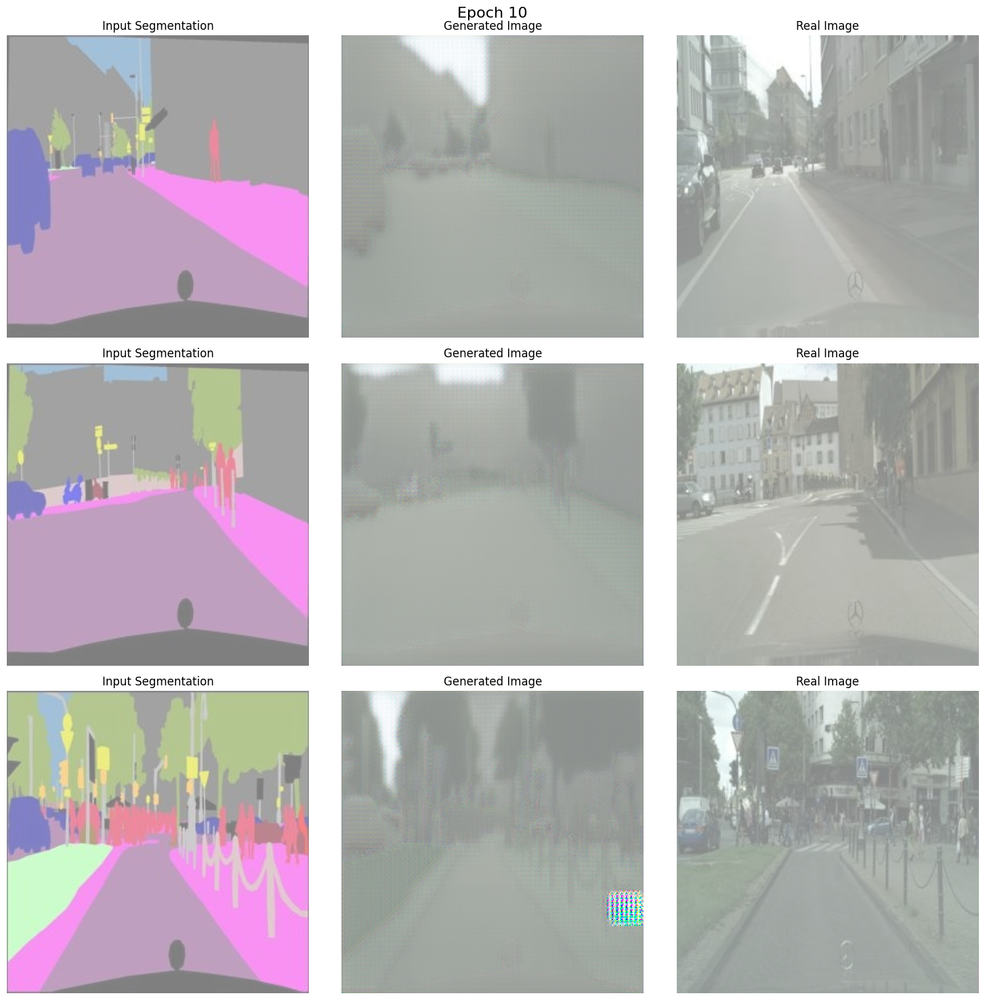

[Epoch 10/50] [Batch 0] [D loss: 1.0936] [G loss: 9.7865]
[Epoch 11/50] [Batch 0] [D loss: 1.4257] [G loss: 8.9412]
[Epoch 12/50] [Batch 0] [D loss: 1.5686] [G loss: 8.9735]
[Epoch 13/50] [Batch 0] [D loss: 1.3914] [G loss: 8.5246]
[Epoch 14/50] [Batch 0] [D loss: 1.3633] [G loss: 9.5608]
[Epoch 15/50] [Batch 0] [D loss: 1.7726] [G loss: 8.8660]
[Epoch 16/50] [Batch 0] [D loss: 1.6997] [G loss: 9.0917]
[Epoch 17/50] [Batch 0] [D loss: 1.0363] [G loss: 10.2570]
[Epoch 18/50] [Batch 0] [D loss: 1.5504] [G loss: 8.8160]
[Epoch 19/50] [Batch 0] [D loss: 1.8207] [G loss: 8.7212]


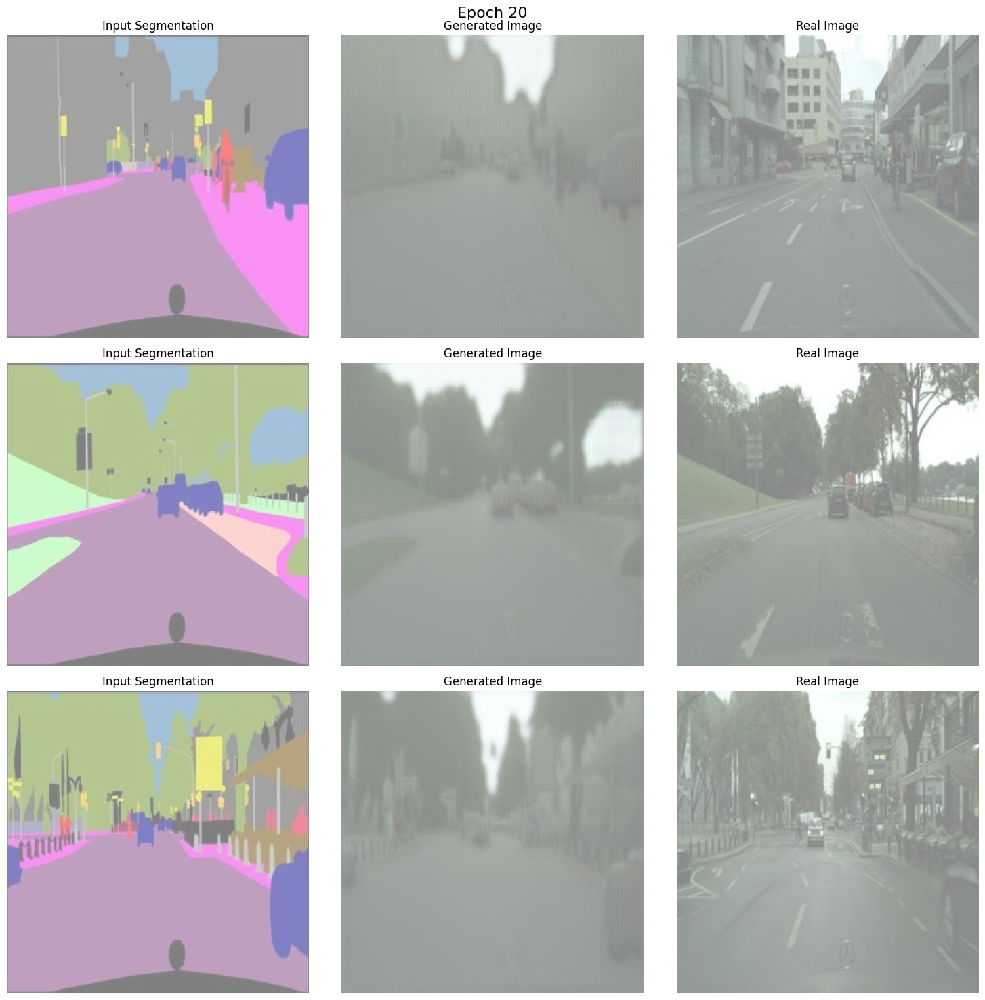

[Epoch 20/50] [Batch 0] [D loss: 1.7033] [G loss: 10.2243]
[Epoch 21/50] [Batch 0] [D loss: 0.9964] [G loss: 9.5225]
[Epoch 22/50] [Batch 0] [D loss: 1.5116] [G loss: 9.3989]
[Epoch 23/50] [Batch 0] [D loss: 1.4275] [G loss: 9.2158]
[Epoch 24/50] [Batch 0] [D loss: 1.4910] [G loss: 9.5742]
[Epoch 25/50] [Batch 0] [D loss: 0.9549] [G loss: 9.0673]
[Epoch 26/50] [Batch 0] [D loss: 1.6175] [G loss: 8.0750]
[Epoch 27/50] [Batch 0] [D loss: 1.9189] [G loss: 9.0936]
[Epoch 28/50] [Batch 0] [D loss: 1.6432] [G loss: 8.9762]
[Epoch 29/50] [Batch 0] [D loss: 0.6594] [G loss: 9.6173]


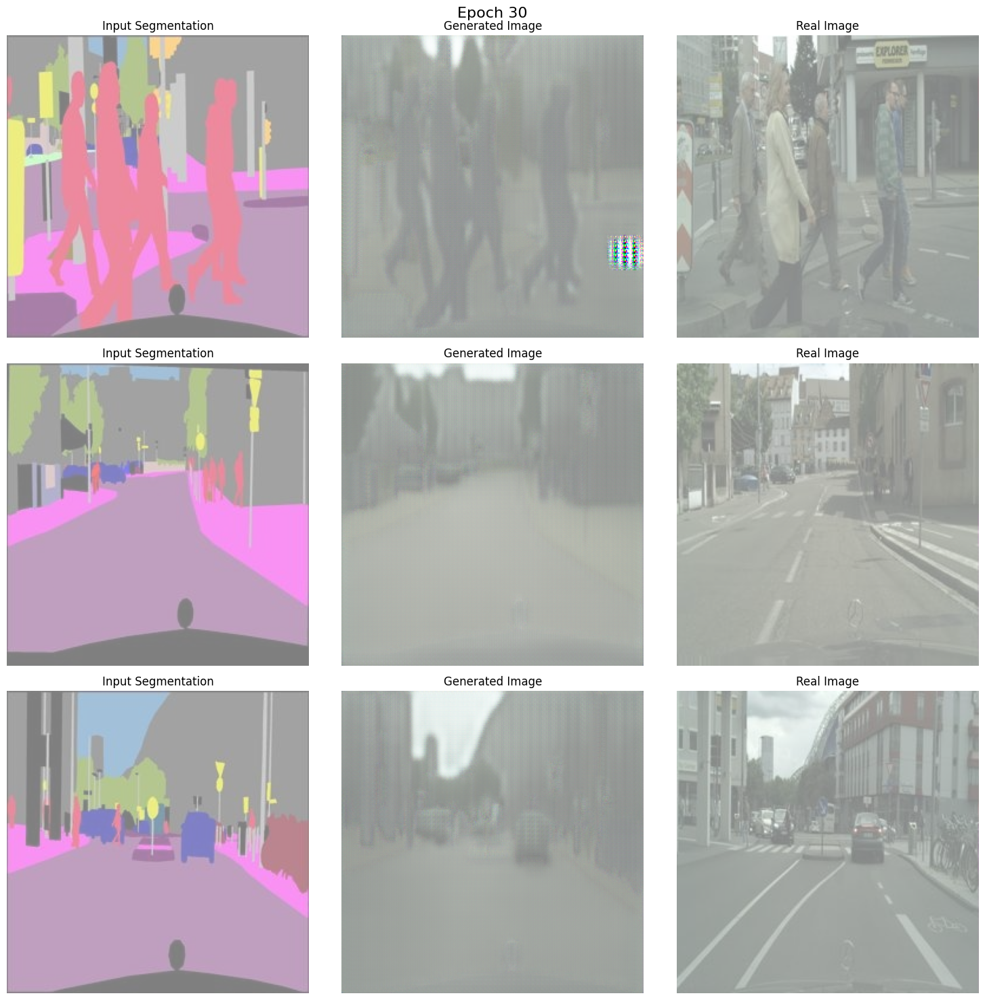

[Epoch 30/50] [Batch 0] [D loss: 2.2049] [G loss: 8.7599]
[Epoch 31/50] [Batch 0] [D loss: 2.0035] [G loss: 8.7054]
[Epoch 32/50] [Batch 0] [D loss: 1.9053] [G loss: 8.5536]
[Epoch 33/50] [Batch 0] [D loss: 1.6358] [G loss: 8.7703]
[Epoch 34/50] [Batch 0] [D loss: 1.3265] [G loss: 8.8149]
[Epoch 35/50] [Batch 0] [D loss: 1.3602] [G loss: 8.0201]
[Epoch 36/50] [Batch 0] [D loss: 2.0587] [G loss: 8.3053]
[Epoch 37/50] [Batch 0] [D loss: 1.2637] [G loss: 8.6622]
[Epoch 38/50] [Batch 0] [D loss: 1.3281] [G loss: 7.8836]
[Epoch 39/50] [Batch 0] [D loss: 2.7031] [G loss: 8.5133]


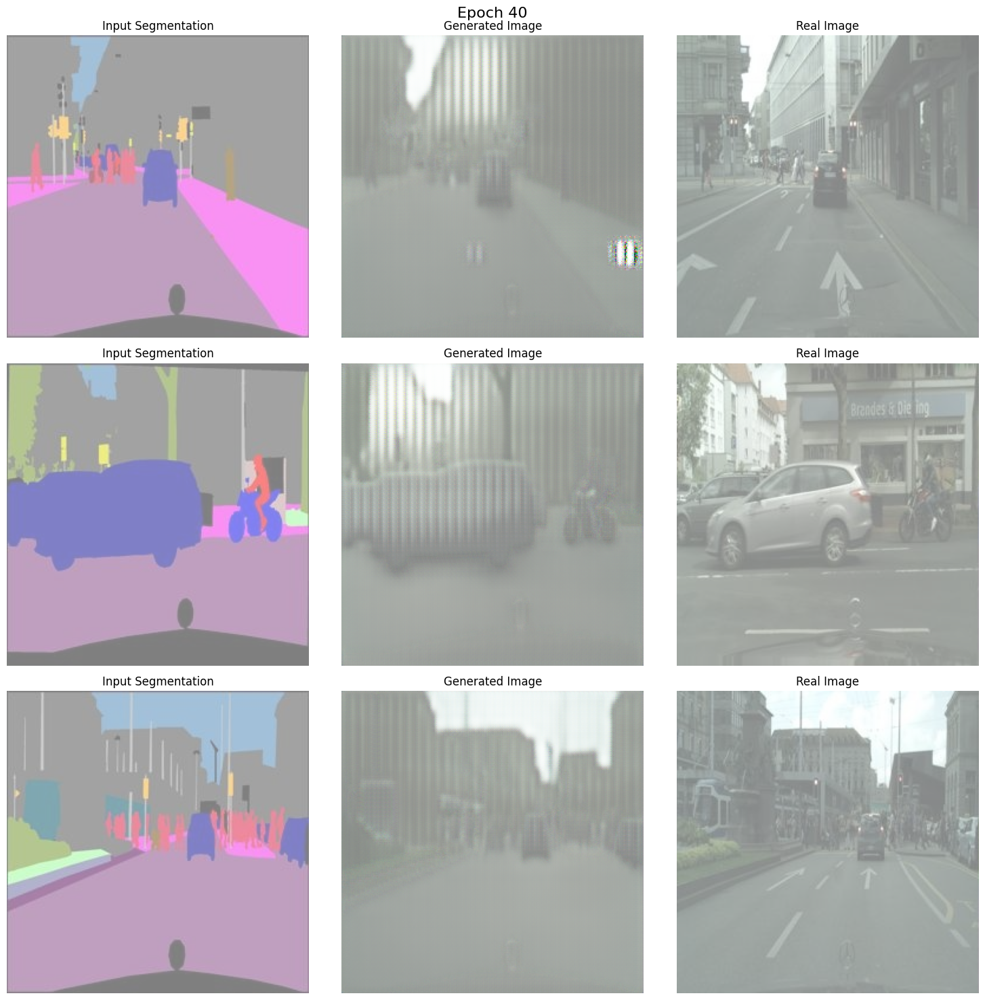

[Epoch 40/50] [Batch 0] [D loss: 1.5630] [G loss: 7.9491]
[Epoch 41/50] [Batch 0] [D loss: 1.0988] [G loss: 8.0297]
[Epoch 42/50] [Batch 0] [D loss: 1.8519] [G loss: 7.7307]
[Epoch 43/50] [Batch 0] [D loss: 1.7516] [G loss: 7.9014]
[Epoch 44/50] [Batch 0] [D loss: 2.1459] [G loss: 7.5801]
[Epoch 45/50] [Batch 0] [D loss: 1.3240] [G loss: 8.2760]
[Epoch 46/50] [Batch 0] [D loss: 1.6356] [G loss: 7.8409]
[Epoch 47/50] [Batch 0] [D loss: 1.9259] [G loss: 7.2246]
[Epoch 48/50] [Batch 0] [D loss: 1.7786] [G loss: 7.2434]
[Epoch 49/50] [Batch 0] [D loss: 1.2831] [G loss: 7.7559]


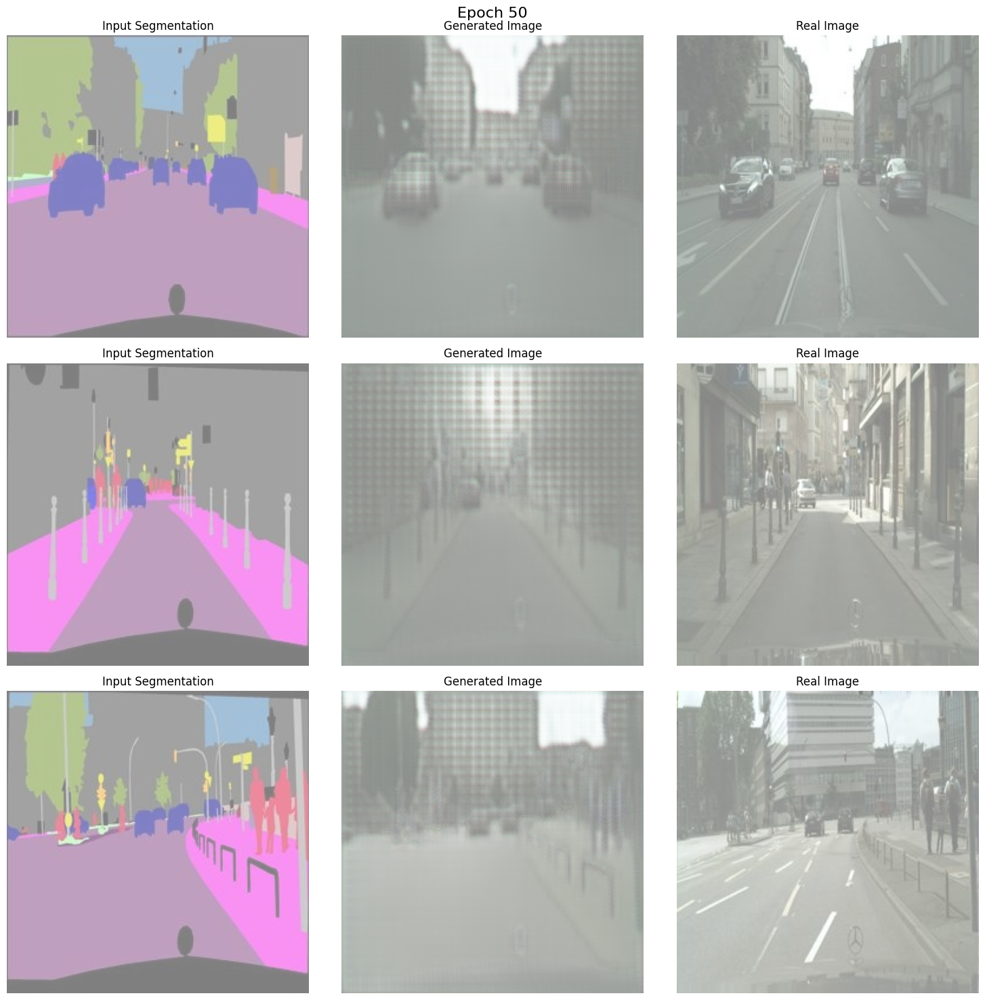

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
generator = Generator().to(device)
discriminator = Discriminator().to(device)

g_losses, d_losses = train_model(generator, discriminator, train_loader, num_epochs=50)

As shown below, the fluctuations of the loss values for G and D reflect on the min-max nature of GANs. However, overall is improving during the training.


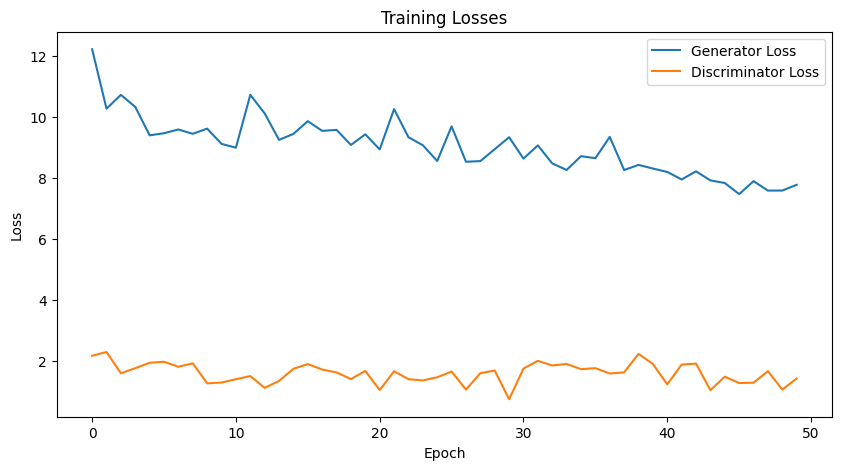

In [8]:
plt.figure(figsize=(10, 5))
plt.plot(g_losses, label='Generator Loss')
plt.plot(d_losses, label='Discriminator Loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.show()